# __Import Required Libraries__

In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import scipy.stats as stats
from scipy.stats import norm
%matplotlib inline

# __Load Dataset__

In [2]:
df = pd.read_csv('BexarWaterQualityData.csv')

# __Understanding Dataset features__

In [3]:
# Check the number of rows and columns
df.shape

(208373, 23)

In [4]:
# Find the column names
df.columns

Index(['station_id', 'short_desc', 'long_desc', 'latitude', 'longitude',
       'tag_id', 'end_date', 'end_time', 'end_depth', 'gtlt', 'result',
       'parameter_cd', 'long_desc.1', 'common_name', 'common_units',
       'detailed_desc', 'units', 'media', 'method', 'min_value', 'max_value',
       'county_name', 'comment'],
      dtype='object')

In [5]:
# Check the existing data
df.head()

,station_id,short_desc,long_desc,latitude,longitude,tag_id,end_date,end_time,end_depth,gtlt,...,common_name,common_units,detailed_desc,units,media,method,min_value,max_value,county_name,comment
0,12689,ROSILLO CREEK UPSTRM SALADO CR,ROSILLO CREEK 0.1 KM ABOVE SALADO CREEK CONFLUENCE,29.320101,-98.406263,SA10917T,2008-09-18 00:00:00,16:52,0.28,NaN,...,Water Temperature,&deg;C,"<p>Water temperature is an important factor in an aquatic ecosystem because it controls biological activities and chemical processes. Stream systems exhibit <em>diel</em> (daily) temperature variations. Most aquatic organisms depend upon the environment to regulate metabolic rates and have adapted to temperature ranges that occur in their habitat. However, alteration of habitat, especially by human activities, can cause temperatures to exceed these ranges.</p><p>Removal of <em>riparian</em> (riverside) vegetation decreases shading and may allow water temperatures to exceed the typical range (as well as destroy microhabitat) due to increased exposure to solar radiation. Increased solar radiation warms water causing metabolic processes to break down. </p><p>Runoff from previously natural, undeveloped areas which are now covered by <em>impermeable surfaces</em> (buildings and pavement) may enter a stream system through storm drains at velocities that can scour and widen a stream channel. Water flowing in wide, shallow streams tends to warm up more quickly than water flowing in natural deep, narrow channels, especially during hot, dry seasons when water volume is low.</p><p>Temperature also affects the amount of dissolved oxygen that is available to aquatic organisms. As a general rule, cool water is capable of retaining more dissolved oxygen than warm water. As water temperatures increase, metabolic activities such as respiration also increase, but less dissolved oxygen is available for consumption. Industrial discharges and wastewater outflows may also release warm water into a stream system increasing the oxygen demand of organisms due to increased metabolic activities. In addition, the affect of oxygen demanding wastes on the aquatic environment is enhanced by warm water temperatures. </p>",DEG C,Water,N/A Calculation,NaN,NaN,Bexar,Abundant algae
1,12689,ROSILLO CREEK UPSTRM SALADO CR,ROSILLO CREEK 0.1 KM ABOVE SALADO CREEK CONFLUENCE,29.320101,-98.406263,SA10917T,2008-09-18 00:00:00,16:52,0.28,NaN,...,NaN,NaN,NaN,CFS,Water,N/A Calculation,NaN,NaN,Bexar,Abundant algae
2,12689,ROSILLO CREEK UPSTRM SALADO CR,ROSILLO CREEK 0.1 KM ABOVE SALADO CREEK CONFLUENCE,29.320101,-98.406263,SA10917T,2008-09-18 00:00:00,16:52,0.28,NaN,...,"Total Dissolved Solids, Calculated",mg/L,"<p>Total Dissolved Solids (TDS) is a measure of the amount of material dissolved in water. This material can include carbonate, bicarbonate, chloride, sulfate, phosphate, nitrate, calcium, magnesium, sodium, organic ions, and other ions. </p><p>A certain level of these ions in water is necessary for aquatic life. Changes in TDS concentrations can be harmful because the density of the water determines the flow of water into and out of an organism&rsquo;s cells (Mitchell and Stapp, 1992). However, if TDS concentrations are too high or too low, the growth of many aquatic life can be limited, and death may occur. </p><p> High concentrations of TDS may also reduce water clarity, contribute to a decrease in photosynthesis, combine with toxic compounds and heavy metals, and lead to an increase in water temperature (KanCRN website).</p><p> The TDS concentration of a water sample can be estimated from specific conductance if a linear correlation between the two parameters is first established. Depending on the chemistry of the water, TDS (in mg/l) can be estimated by multiplying specific conductance (in micromhos/cm) by a factor between 0.55 and 0.75. </p><h3> Factors Affecting Total Dissolved Solids</h3><p> <strong><em>Geology and Soil in the Watershed:</em></strong> Some rock and soil release ions ve

In [6]:
# Check for null count in the dataset
null_counts = df.isnull().sum()
null_counts[null_counts > 0].sort_values(ascending=False)

min_value        208373
max_value        208373
gtlt             188453
common_name      131929
common_units     131929
detailed_desc    131929
comment           98432
dtype: int64

In [7]:
# Check the Data types of each column
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 208373 entries, 0 to 208372
Data columns (total 23 columns):
 #   Column         Non-Null Count   Dtype  
---  ------         --------------   -----  
 0   station_id     208373 non-null  int64  
 1   short_desc     208373 non-null  object 
 2   long_desc      208373 non-null  object 
 3   latitude       208373 non-null  float64
 4   longitude      208373 non-null  float64
 5   tag_id         208373 non-null  object 
 6   end_date       208373 non-null  object 
 7   end_time       208373 non-null  object 
 8   end_depth      208373 non-null  float64
 9   gtlt           19920 non-null   object 
 10  result         208373 non-null  object 
 11  parameter_cd   208373 non-null  int64  
 12  long_desc.1    208373 non-null  object 
 13  common_name    76444 non-null   object 
 14  common_units   76444 non-null   object 
 15  detailed_desc  76444 non-null   object 
 16  units          208373 non-null  object 
 17  media          208373 non-nul

### _From the above observations, we found that all the columns may not be required for the analysis. Data seems to be arranged in a manner that a number of different parameters are collected from each station. So, in the below steps we tried to identify the different parameters present in the data._

# __All Water Quality Parameters Present in Dataset__

In [8]:
df_param = df[['parameter_cd','long_desc.1','common_name','detailed_desc','units']]
p_groups = df_param.groupby(['parameter_cd','long_desc.1', 'units'])
p_list = []
high_count_list = []
for val,f in p_groups:
    p_list.append(val)
    print("Parameter '{0}' Has {1} Records".format(val[0],len(f)))
    if(len(f) > 3000):
        ls = list(val)
        ls.append(len(f))
        high_count_list.append(ls)
frame = pd.DataFrame(data=p_list,columns=['parameter_cd','long_desc.1', 'units'])
frame
# frame.to_csv('all_parameters.csv')

Parameter '10' Has 7986 Records
Parameter '61' Has 6909 Records
Parameter '78' Has 5453 Records
Parameter '94' Has 7955 Records
Parameter '209' Has 476 Records
Parameter '210' Has 476 Records
Parameter '211' Has 476 Records
Parameter '212' Has 476 Records
Parameter '213' Has 476 Records
Parameter '214' Has 476 Records
Parameter '215' Has 472 Records
Parameter '216' Has 472 Records
Parameter '221' Has 443 Records
Parameter '222' Has 443 Records
Parameter '223' Has 441 Records
Parameter '300' Has 7875 Records
Parameter '310' Has 138 Records
Parameter '314' Has 165 Records
Parameter '400' Has 7914 Records
Parameter '403' Has 11 Records
Parameter '410' Has 33 Records
Parameter '530' Has 5335 Records
Parameter '535' Has 60 Records
Parameter '610' Has 4595 Records
Parameter '615' Has 4620 Records
Parameter '620' Has 4619 Records
Parameter '625' Has 4276 Records
Parameter '665' Has 4595 Records
Parameter '671' Has 715 Records
Parameter '680' Has 1762 Records
Parameter '681' Has 23 Records
Par

,parameter_cd,long_desc.1,units
0,10,"TEMPERATURE, WATER (DEGREES CENTIGRADE)",DEG C
1,61,"FLOW STREAM, INSTANTANEOUS (CUBIC FEET PER SEC)",CFS
2,78,"TRANSPARENCY, SECCHI DISC (METERS)",M
3,94,"SPECIFIC CONDUCTANCE,FIELD (US/CM @ 25C)",uS/cm
4,209,"TEMPERATURE, WATER (DEGREES CENTIGRADE), 24HR AVG",DEG C
...,...,...,...
313,99095,LEPOMIS GULOSUS (#/SAMPLE),#/SAMP
314,99096,LEPOMIS HUMILIS (#/SAMPLE),#/SAMP
315,99097,LEPOMIS MACROCHIRUS (#/SAMPLE),#/SAMP
316,99099,LEPOMIS MEGALOTIS (#/SAMPLE),#/SAMP


# __list of all parameters with greater than 3000 occurences__

In [9]:
high_count_frame = pd.DataFrame(data=high_count_list,columns=['parameter_cd','long_desc.1', 'units', 'count'])
high_count_frame

,parameter_cd,long_desc.1,units,count
0,10,"TEMPERATURE, WATER (DEGREES CENTIGRADE)",DEG C,7986
1,61,"FLOW STREAM, INSTANTANEOUS (CUBIC FEET PER SEC)",CFS,6909
2,78,"TRANSPARENCY, SECCHI DISC (METERS)",M,5453
3,94,"SPECIFIC CONDUCTANCE,FIELD (US/CM @ 25C)",uS/cm,7955
4,300,"OXYGEN, DISSOLVED (MG/L)",MG/L,7875
...,...,...,...,...
19,89966,"PRESENT WEATHER (1=CLEAR,2=PTCLDY,3=CLDY,4=RAIN,5=OTHER)",NS,10010
20,89969,WATER COLOR 1=BRWN 2=RED 3=GRN 4=BLCK 5=CLR 6=OT,NS,9540
21,89971,"WATER ODOR (1=SEWAGE, 2=OILY/CHEMICAL, 3=ROTTEN EGGS, 4=MUSKY, 5=FISHY, 6=NONE,",NU,9545
22,89978,"RECREATIONAL USE: 1 = PRIMARY CONTACT, OBSERVED ACTIVITY; 2 = SECONDARY CONTACT,",NU,3946


### _Since all parameters doesn't have enough records, we will consider only those parameters with adequate number of records. By closely observing the dataset, it seems like the common_name field is not empty for those records. So we will extract out those records as follows._

### Further narrowd down parameters by removing 'Days Since Last Precipitation','Sulfate','Ammonia-Nitrogen'
### as these are not really considered in San Antonios determination of water quality

In [10]:
df_param = df[['parameter_cd','long_desc.1','common_name','detailed_desc','units']]
df_param = df_param[df_param['common_name'].notna()] # | (df_param['parameter_cd'] == 1351)
df_param = df_param[~df_param['common_name'].isin( ['Days Since Last Precipitation','Sulfate','Ammonia-Nitrogen'])]
df_param = df_param.drop_duplicates(keep='last').sort_values('parameter_cd')
df_param.reset_index(drop=True, inplace=True)
# df_param.to_csv("parameter_desc.csv")
df_param

,parameter_cd,long_desc.1,common_name,detailed_desc,units
0,10,"TEMPERATURE, WATER (DEGREES CENTIGRADE)",Water Temperature,"<p>Water temperature is an important factor in an aquatic ecosystem because it controls biological activities and chemical processes. Stream systems exhibit <em>diel</em> (daily) temperature variations. Most aquatic organisms depend upon the environment to regulate metabolic rates and have adapted to temperature ranges that occur in their habitat. However, alteration of habitat, especially by human activities, can cause temperatures to exceed these ranges.</p><p>Removal of <em>riparian</em> (riverside) vegetation decreases shading and may allow water temperatures to exceed the typical range (as well as destroy microhabitat) due to increased exposure to solar radiation. Increased solar radiation warms water causing metabolic processes to break down. </p><p>Runoff from previously natural, undeveloped areas which are now covered by <em>impermeable surfaces</em> (buildings and pavement) may enter a stream system through storm drains at velocities that can scour and widen a stream channel. Water flowing in wide, shallow streams tends to warm up more quickly than water flowing in natural deep, narrow channels, especially during hot, dry seasons when water volume is low.</p><p>Temperature also affects the amount of dissolved oxygen that is available to aquatic organisms. As a general rule, cool water is capable of retaining more dissolved oxygen than warm water. As water temperatures increase, metabolic activities such as respiration also increase, but less dissolved oxygen is available for consumption. Industrial discharges and wastewater outflows may also release warm water into a stream system increasing the oxygen demand of organisms due to increased metabolic activities. In addition, the affect of oxygen demanding wastes on the aquatic environment is enhanced by warm water temperatures. </p>",DEG C
1,94,"SPECIFIC CONDUCTANCE,FIELD (US/CM @ 25C)","Total Dissolved Solids, Calculated","<p>Total Dissolved Solids (TDS) is a measure of the amount of material dissolved in water. This material can include carbonate, bicarbonate, chloride, sulfate, phosphate, nitrate, calcium, magnesium, sodium, organic ions, and other ions. </p><p>A certain level of these ions in water is necessary for aquatic life. Changes in TDS concentrations can be harmful because the density of the water determines the flow of water into and out of an organism&rsquo;s cells (Mitchell and Stapp, 1992). However, if TDS concentrations are too high or too low, the growth of many aquatic life can be limited, and death may occur. </p><p> High concentrations of TDS may also reduce water clarity, contribute to a decrease in photosynthesis, combine with toxic compounds and heavy metals, and lead to an increase in water temperature (KanCRN website).</p><p> The TDS concentration of a water sample can be estimated from specific conductance if a linear correlation between the two parameters is first established. Depending on the chemistry of the water, TDS (in mg/l) can be estimated by multiplying specific conductance (in micromhos/cm) by a factor between 0.55 and 0.75. </p><h3> Factors Affecting Total Dissolved Solids</h3><p> <strong><em>Geology and Soil in the Watershed:</em></strong> Some rock and soil release ions very easily when water flows over them; for example, if acidic water flows over rocks containing calcite (CaCO<sub>3</sub>), such as calcareous shales, calcium (Ca<sup>2</sup>+) and carbonate (CO<sub>3</sub><sup>2</sup>-) ions will dissolve into the water. Therefore, TDS will increase. However, some rocks, such as quartz-rich granite, are very resistant to dissolution, and don&rsquo;t dissolve easily when water flows over them. TDS of waters draining areas where the geology only consists of granite or other resistant rocks will be low (unless other factors are involved).</p><p><strong><em>Urban Runoff:</em></strong> During storm events, pollu

In [11]:
valid_params = []
valid_param_codes = {}
for idx, row in df_param.iterrows():
    valid_params.append("{0} ({1})".format(row[2],row[4]))
    valid_param_codes[row[0]] = valid_params[-1]
    print(valid_params[-1])


Water Temperature (DEG C)
Total Dissolved Solids, Calculated (uS/cm)
Dissolved Oxygen (MG/L)
pH (S.U.)
Total Suspended Solids (MG/L)
Nitrate-Nitrogen (MG/L)
Total Phosphorus (MG/L)
Chloride (MG/L)
E. coli (MPN/100ml)


# __All Stations Present in DataSet__

In [12]:
df_station = df[['station_id', 'short_desc', 'long_desc']]
df_station = df_station.drop_duplicates(keep='last').sort_values('station_id')
df_station.reset_index(drop=True, inplace=True)
df_station.head()

,station_id,short_desc,long_desc
0,12689,ROSILLO CREEK UPSTRM SALADO CR,ROSILLO CREEK 0.1 KM ABOVE SALADO CREEK CONFLUENCE
1,12690,ROSILLO CREEK AT W W WHITE RD,ROSILLO CREEK AT W.W. WHITE ROAD IN SAN ANTONIO
2,12692,SALADO CREEK TRIB IN J ST PARK,UNNAMED TRIBUTARY OF SALADO CREEK IN J STREET PARK AT EAST END OF J STREET
3,12693,MENGER CREEK AT COLISEUM ROAD,MENGER CREEK IMMEDIATELY UPSTREAM OF COLISEUM ROAD
4,12698,WALZEM CREEK AT HOLBROOK RD,WALZEM CREEK AT HOLBROOK ROAD


# __Cleaning up the data__

In [13]:
all_columns = df.columns

# all rows with a non-nul result feild
df_common = df[df['result'].notna()]

# So the resulting dataset will have columns specified below
columns_tobe_droped = all_columns.drop(['station_id','short_desc','end_date','end_time','result','parameter_cd'])
df_common = df_common.drop(columns_tobe_droped, axis=1)
df_common.reset_index(drop=True, inplace=True)
df_common.head()

,station_id,short_desc,end_date,end_time,result,parameter_cd
0,12689,ROSILLO CREEK UPSTRM SALADO CR,2008-09-18 00:00:00,16:52,22.7,10
1,12689,ROSILLO CREEK UPSTRM SALADO CR,2008-09-18 00:00:00,16:52,0.03,61
2,12689,ROSILLO CREEK UPSTRM SALADO CR,2008-09-18 00:00:00,16:52,603,94
3,12689,ROSILLO CREEK UPSTRM SALADO CR,2008-09-18 00:00:00,16:52,3,1351
4,12689,ROSILLO CREEK UPSTRM SALADO CR,2008-09-18 00:00:00,16:52,120,31699


## _Now we need to set the result feild data type to float_

In [14]:
df_common = df_common[(df_common.result != 'Not Reported') & (df.result != 'No Pool')]
df_common[['result']] = df_common[['result']].astype(str).astype(float)
df_common['end_date'] = pd.to_datetime(df_common['end_date'])

In [15]:
df_common.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 208314 entries, 0 to 208372
Data columns (total 6 columns):
 #   Column        Non-Null Count   Dtype         
---  ------        --------------   -----         
 0   station_id    208314 non-null  int64         
 1   short_desc    208314 non-null  object        
 2   end_date      208314 non-null  datetime64[ns]
 3   end_time      208314 non-null  object        
 4   result        208314 non-null  float64       
 5   parameter_cd  208314 non-null  int64         
dtypes: datetime64[ns](1), float64(1), int64(2), object(2)
memory usage: 11.1+ MB


##  _Get each parameters as a column instead of in a row_

In [16]:
c_group = ['station_id','short_desc','end_date','end_time']
df_p = (df_common.pivot_table(index = c_group, columns = 'parameter_cd', values = 'result').reset_index().rename_axis(None, axis = 1))
extracted_columns = list(valid_param_codes.keys()) + c_group
c_dropped = [x for x in df_p.columns if x not in  extracted_columns]
df_p.drop(c_dropped, axis=1, inplace=True)
df_p.head()

,station_id,short_desc,end_date,end_time,10,94,300,400,530,620,665,940,31699
0,12689,ROSILLO CREEK UPSTRM SALADO CR,2008-09-18,16:52,22.7,603.0,8.2,8.1,NaN,NaN,NaN,NaN,120.0
1,12689,ROSILLO CREEK UPSTRM SALADO CR,2008-11-20,14:00,13.0,1040.0,3.7,7.7,NaN,NaN,NaN,NaN,420.0
2,12689,ROSILLO CREEK UPSTRM SALADO CR,2008-12-10,12:15,10.9,1220.0,7.0,7.8,NaN,NaN,NaN,NaN,55.0
3,12689,ROSILLO CREEK UPSTRM SALADO CR,2009-01-15,12:15,8.6,1140.0,12.4,8.3,NaN,NaN,NaN,NaN,210.0
4,12689,ROSILLO CREEK UPSTRM SALADO CR,2009-02-19,13:00,15.1,1190.0,9.8,8.1,NaN,NaN,NaN,NaN,280.0


## _Rename the column names to more readable format instead of parameter code_

In [17]:
df_p.rename(columns = valid_param_codes, inplace = True)
df_p.head()

,station_id,short_desc,end_date,end_time,Water Temperature (DEG C),"Total Dissolved Solids, Calculated (uS/cm)",Dissolved Oxygen (MG/L),pH (S.U.),Total Suspended Solids (MG/L),Nitrate-Nitrogen (MG/L),Total Phosphorus (MG/L),Chloride (MG/L),E. coli (MPN/100ml)
0,12689,ROSILLO CREEK UPSTRM SALADO CR,2008-09-18,16:52,22.7,603.0,8.2,8.1,NaN,NaN,NaN,NaN,120.0
1,12689,ROSILLO CREEK UPSTRM SALADO CR,2008-11-20,14:00,13.0,1040.0,3.7,7.7,NaN,NaN,NaN,NaN,420.0
2,12689,ROSILLO CREEK UPSTRM SALADO CR,2008-12-10,12:15,10.9,1220.0,7.0,7.8,NaN,NaN,NaN,NaN,55.0
3,12689,ROSILLO CREEK UPSTRM SALADO CR,2009-01-15,12:15,8.6,1140.0,12.4,8.3,NaN,NaN,NaN,NaN,210.0
4,12689,ROSILLO CREEK UPSTRM SALADO CR,2009-02-19,13:00,15.1,1190.0,9.8,8.1,NaN,NaN,NaN,NaN,280.0


In [18]:
df_p.shape

(11406, 13)

## __Drop all rows with null values in it__

In [19]:
df_p = df_p.dropna()
# df_p.to_csv('filtered_anp.csv')
df_p.shape

(3323, 13)

In [20]:
df_p.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 3323 entries, 164 to 11386
Data columns (total 13 columns):
 #   Column                                      Non-Null Count  Dtype         
---  ------                                      --------------  -----         
 0   station_id                                  3323 non-null   int64         
 1   short_desc                                  3323 non-null   object        
 2   end_date                                    3323 non-null   datetime64[ns]
 3   end_time                                    3323 non-null   object        
 4   Water Temperature (DEG C)                   3323 non-null   float64       
 5   Total Dissolved Solids, Calculated (uS/cm)  3323 non-null   float64       
 6   Dissolved Oxygen (MG/L)                     3323 non-null   float64       
 7   pH (S.U.)                                   3323 non-null   float64       
 8   Total Suspended Solids (MG/L)               3323 non-null   float64       
 9   Nitra

## _Check for null values now_

In [21]:
df_p.isna().any()

station_id                                    False
short_desc                                    False
end_date                                      False
end_time                                      False
Water Temperature (DEG C)                     False
Total Dissolved Solids, Calculated (uS/cm)    False
Dissolved Oxygen (MG/L)                       False
pH (S.U.)                                     False
Total Suspended Solids (MG/L)                 False
Nitrate-Nitrogen (MG/L)                       False
Total Phosphorus (MG/L)                       False
Chloride (MG/L)                               False
E. coli (MPN/100ml)                           False
dtype: bool

In [22]:
corelation = df_p.corr()
corelation.head()

,station_id,Water Temperature (DEG C),"Total Dissolved Solids, Calculated (uS/cm)",Dissolved Oxygen (MG/L),pH (S.U.),Total Suspended Solids (MG/L),Nitrate-Nitrogen (MG/L),Total Phosphorus (MG/L),Chloride (MG/L),E. coli (MPN/100ml)
station_id,1.000000,0.055662,-0.064346,0.073609,-0.010786,-0.056776,0.088449,-0.040045,-0.016546,0.044462
Water Temperature (DEG C),0.055662,1.000000,0.131071,-0.350636,-0.016347,0.023771,0.155634,0.155885,0.183113,-0.013772
"Total Dissolved Solids, Calculated (uS/cm)",-0.064346,0.131071,1.000000,-0.069008,-0.165001,-0.151075,0.649663,0.637918,0.916295,-0.238654
Dissolved Oxygen (MG/L),0.073609,-0.350636,-0.069008,1.000000,0.509878,-0.019482,-0.081962,-0.178096,-0.083405,-0.040061
pH (S.U.),-0.010786,-0.016347,-0.165001,0.509878,1.000000,0.073146,-0.279490,-0.257293,-0.130677,0.004085


# __Correlation matrix of selected Parameters__

<AxesSubplot:>

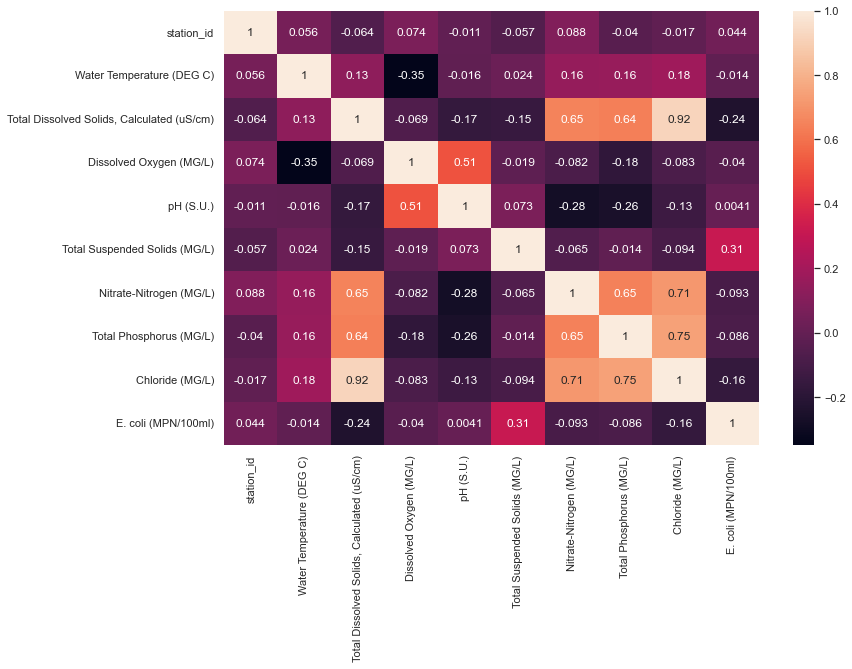

In [23]:
sns.set(rc = {'figure.figsize':(12,8)})
sns.heatmap(corelation, xticklabels=corelation.columns, yticklabels=corelation.columns, annot=True)
# plt.savefig('test.svg')

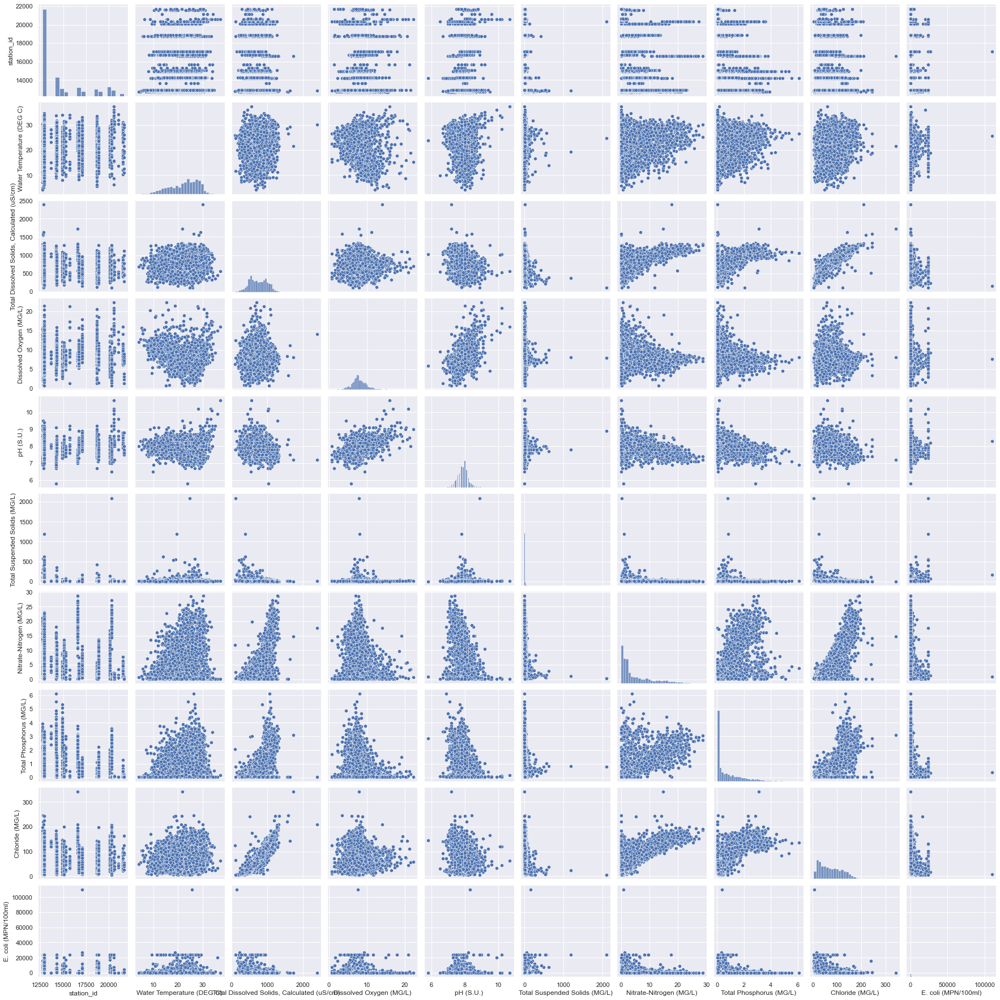

In [24]:
sns.pairplot(data=df_p)

In [25]:
# sns.lineplot(x='end_date', y='pH', data=df_p, hue='short_desc')

In [26]:
# sns.histplot(x='end_date', y='pH', data=df_p)

In [27]:
# sns.displot(data=df_p,x='station_id',y='pH',kind='kde')

In [28]:
# sns.boxplot(data=df_p,x='station_id',y='pH')

# __Remove the outlier values from the DataSet__

Water Temperature (DEG C)


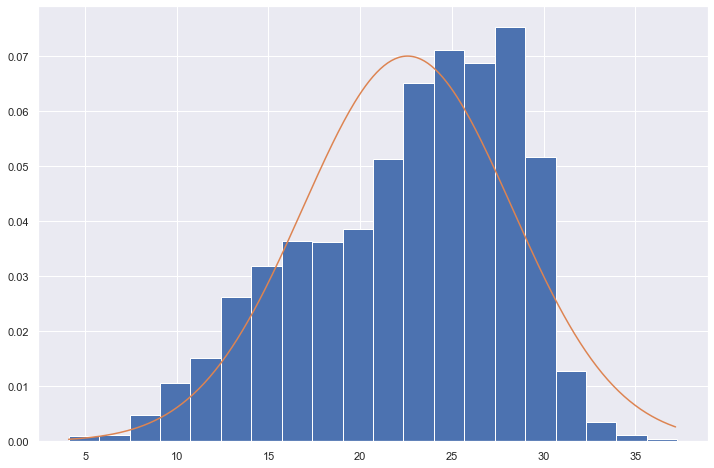


Total Dissolved Solids, Calculated (uS/cm)


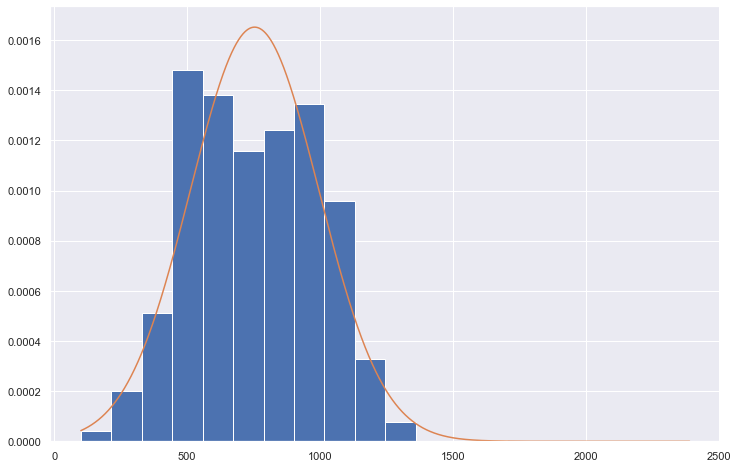


Dissolved Oxygen (MG/L)


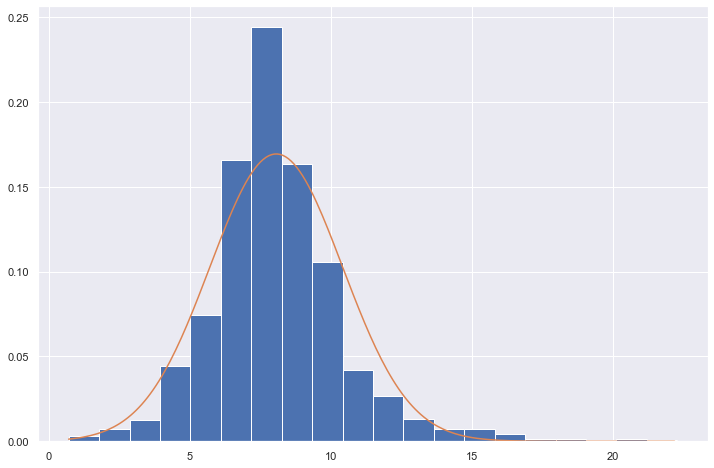


pH (S.U.)


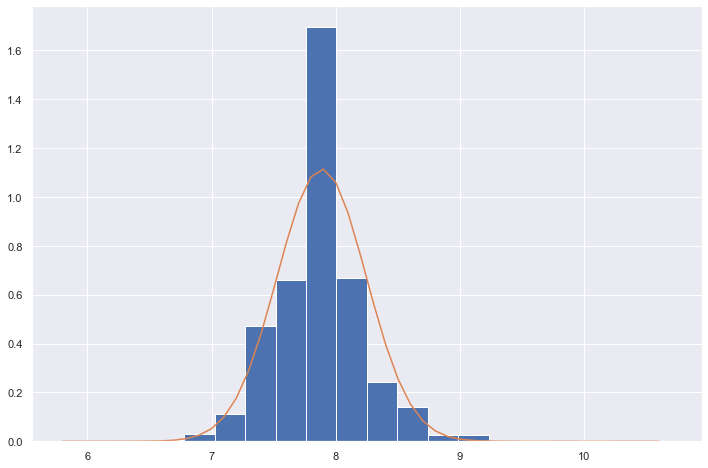


Total Suspended Solids (MG/L)


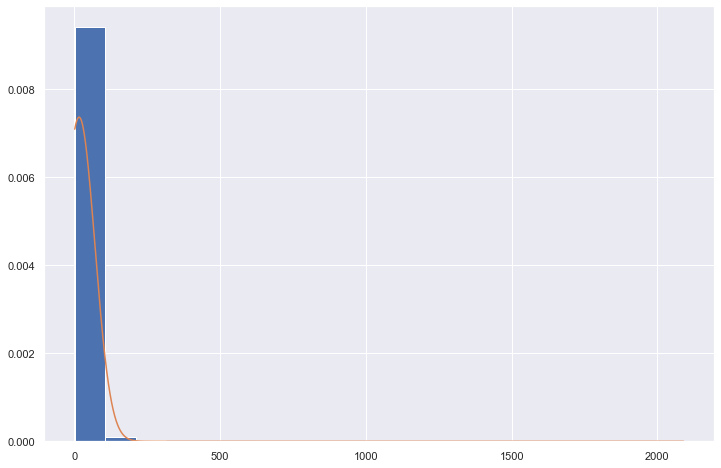


Nitrate-Nitrogen (MG/L)


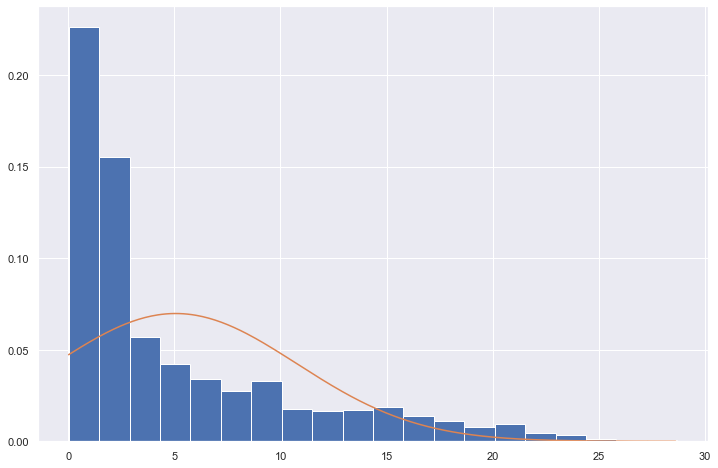


Total Phosphorus (MG/L)


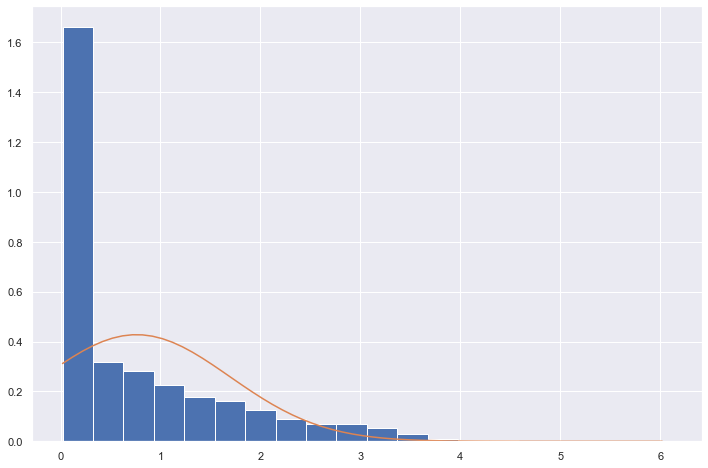


Chloride (MG/L)


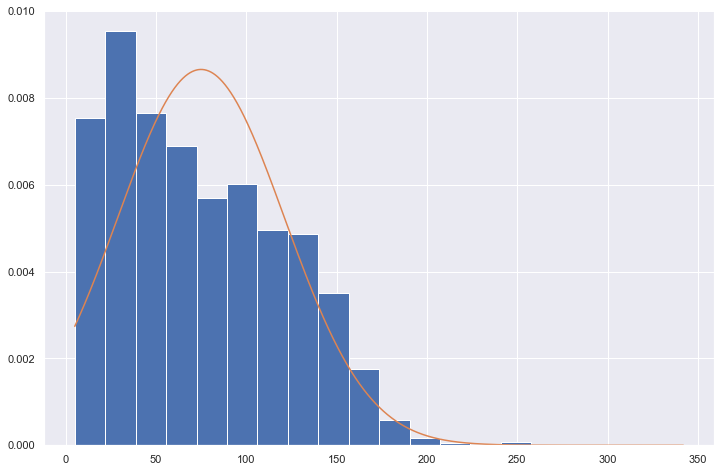


E. coli (MPN/100ml)


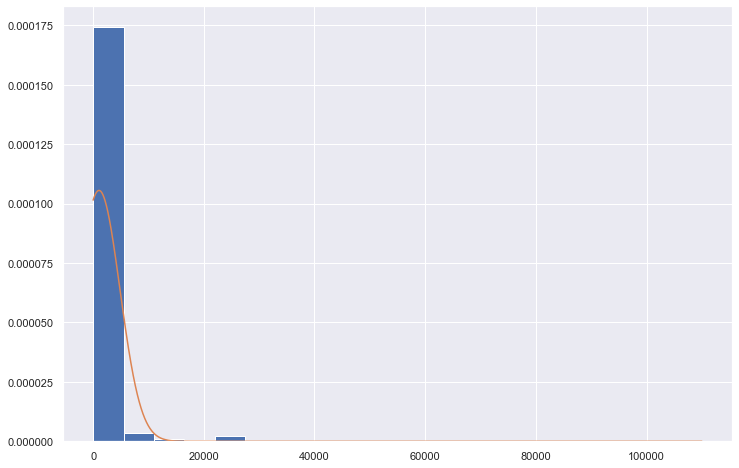

In [29]:
for val in valid_params:
    print(val)
    data = df_p[val]
    plt.hist(data, bins=20, density=True)

    rng = np.arange(data.min(), data.max(), 0.1)
    plt.plot(rng,norm.pdf(rng,data.mean(), data.std()))
    plt.show()
    print("")

Water Temperature (DEG C)


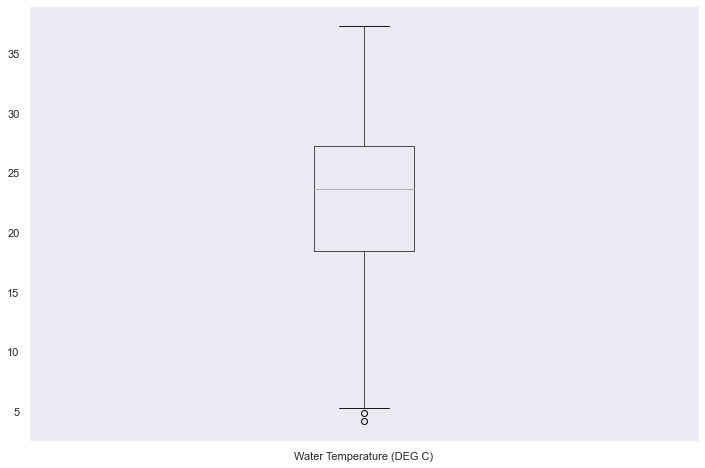

Total Dissolved Solids, Calculated (uS/cm)


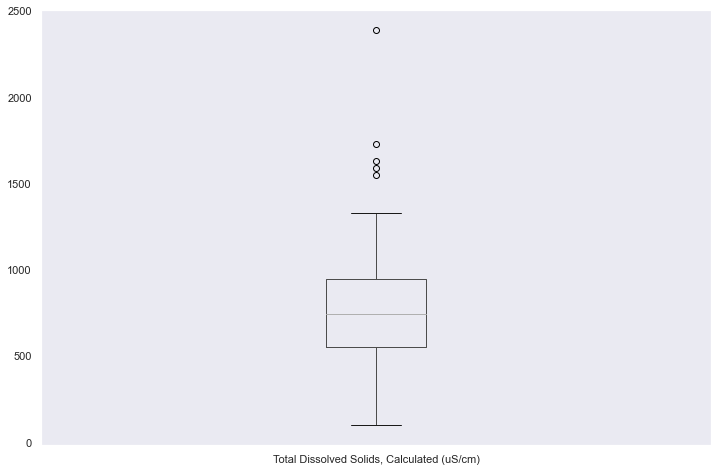

Dissolved Oxygen (MG/L)


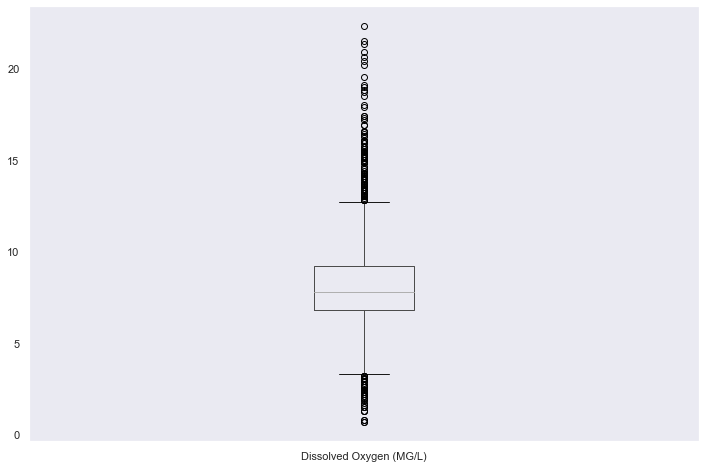

pH (S.U.)


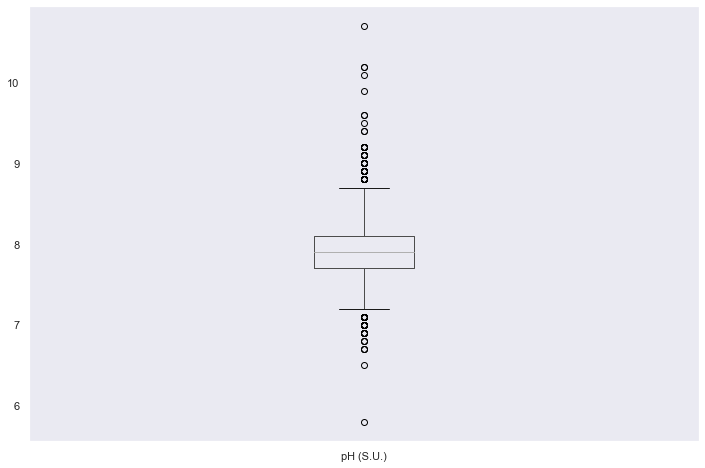

Total Suspended Solids (MG/L)


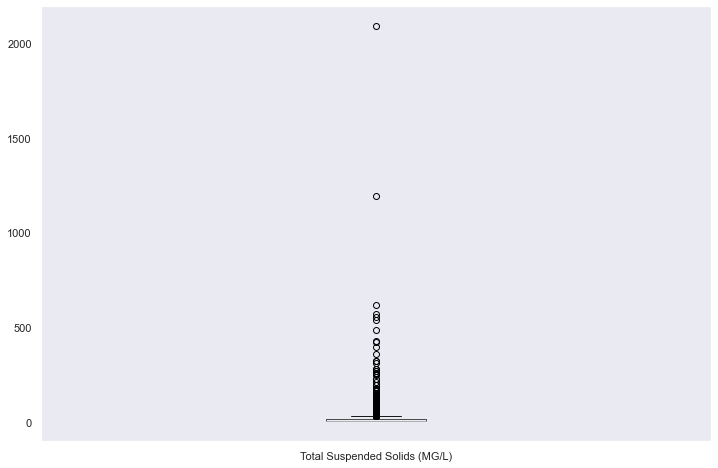

Nitrate-Nitrogen (MG/L)


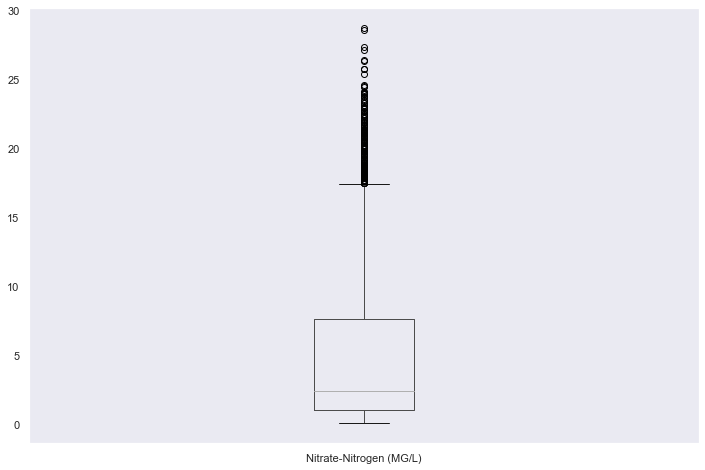

Total Phosphorus (MG/L)


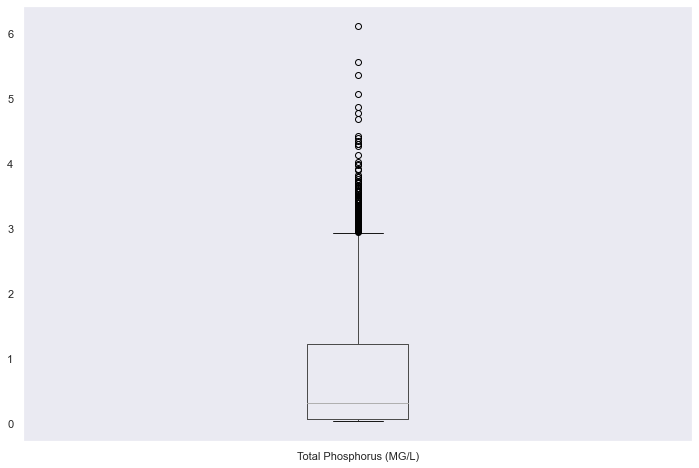

Chloride (MG/L)


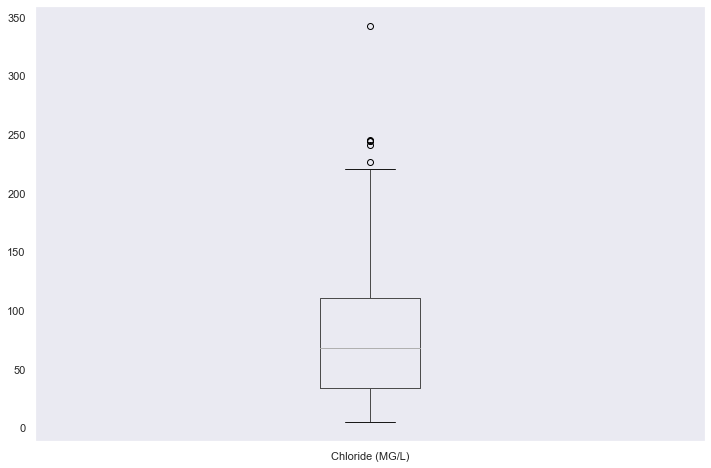

E. coli (MPN/100ml)


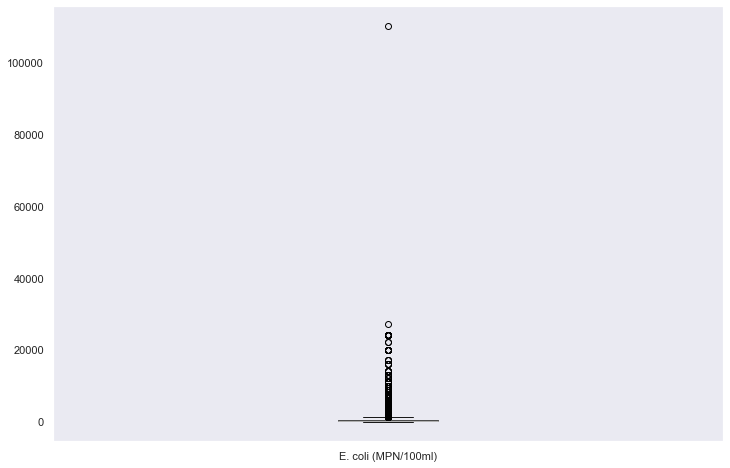

In [30]:
for feature in valid_params:
    print(feature)
    df_p.boxplot(column=[feature])
    plt.grid(False)
    plt.show()

In [31]:

#find absolute value of z-score for each observation
z = np.abs(stats.zscore(df_p[valid_params]))

#only keep rows in dataframe with all z-scores less than absolute value of 3 
data_clean = df_p[(z<3).all(axis=1)]
data_clean.head()

,station_id,short_desc,end_date,end_time,Water Temperature (DEG C),"Total Dissolved Solids, Calculated (uS/cm)",Dissolved Oxygen (MG/L),pH (S.U.),Total Suspended Solids (MG/L),Nitrate-Nitrogen (MG/L),Total Phosphorus (MG/L),Chloride (MG/L),E. coli (MPN/100ml)
164,12698,WALZEM CREEK AT HOLBROOK RD,2017-09-18,09:43,27.3,921.0,11.5,7.9,2.6,4.46,0.020,65.6,330.0
165,12698,WALZEM CREEK AT HOLBROOK RD,2017-11-27,08:42,13.2,1000.0,9.6,7.9,2.8,4.66,0.020,66.7,230.0
166,12698,WALZEM CREEK AT HOLBROOK RD,2018-01-22,09:26,9.2,1010.0,12.2,8.0,18.9,4.39,0.025,64.1,26.0
167,12698,WALZEM CREEK AT HOLBROOK RD,2018-03-05,08:10,20.5,911.0,7.9,7.9,2.0,3.44,0.020,65.1,86.0
168,12698,WALZEM CREEK AT HOLBROOK RD,2018-05-16,08:33,29.3,991.0,11.4,8.2,1.0,4.39,0.020,65.1,330.0


In [32]:
df_p.describe()

,station_id,Water Temperature (DEG C),"Total Dissolved Solids, Calculated (uS/cm)",Dissolved Oxygen (MG/L),pH (S.U.),Total Suspended Solids (MG/L),Nitrate-Nitrogen (MG/L),Total Phosphorus (MG/L),Chloride (MG/L),E. coli (MPN/100ml)
count,3323.000000,3323.000000,3323.00000,3323.000000,3323.000000,3323.000000,3323.000000,3323.000000,3323.000000,3323.000000
mean,14840.203732,22.582967,753.50015,8.066596,7.886007,15.883000,5.062312,0.760960,74.920939,1062.186578
std,2682.612397,5.701263,241.57134,2.355695,0.357974,54.140167,5.715548,0.932585,46.095729,3779.369634
min,12698.000000,4.100000,100.00000,0.700000,5.800000,1.000000,0.020000,0.020000,5.000000,1.000000
25%,12886.000000,18.400000,553.00000,6.800000,7.700000,4.000000,1.010000,0.060000,33.950000,54.000000
50%,12916.000000,23.600000,743.00000,7.800000,7.900000,6.000000,2.410000,0.309000,67.400000,170.000000
75%,16584.000000,27.200000,948.00000,9.200000,8.100000,14.800000,7.580000,1.210000,110.500000,550.000000
max,21705.000000,37.300000,2390.00000,22.300000,10.700000,2090.000000,28.700000,6.110000,342.000000,110000.000000


In [33]:
data_clean.describe()

,station_id,Water Temperature (DEG C),"Total Dissolved Solids, Calculated (uS/cm)",Dissolved Oxygen (MG/L),pH (S.U.),Total Suspended Solids (MG/L),Nitrate-Nitrogen (MG/L),Total Phosphorus (MG/L),Chloride (MG/L),E. coli (MPN/100ml)
count,3074.000000,3074.000000,3074.000000,3074.000000,3074.000000,3074.000000,3074.000000,3074.000000,3074.000000,3074.000000
mean,14780.065387,22.483377,750.490891,7.954587,7.880742,12.323198,4.909196,0.717784,73.511614,600.460638
std,2659.623496,5.660819,231.234609,2.056371,0.309098,16.619416,5.362789,0.855300,44.320355,1346.234485
min,12698.000000,5.600000,100.000000,1.300000,6.900000,1.000000,0.050000,0.020000,5.520000,1.000000
25%,12875.000000,18.300000,555.000000,6.800000,7.700000,4.000000,1.020000,0.060000,33.825000,56.000000
50%,12916.000000,23.500000,740.000000,7.800000,7.900000,6.200000,2.410000,0.288000,66.600000,170.000000
75%,16584.000000,27.200000,943.000000,9.200000,8.100000,14.800000,7.510000,1.177500,108.000000,520.000000
max,21705.000000,34.300000,1320.000000,15.100000,8.900000,178.000000,22.200000,3.550000,209.000000,12000.000000


# K-means

In [34]:
from sklearn.cluster import KMeans 
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()

data_clean_test = data_clean.copy(deep=True)

#gets only numerical data from parameters
X = data_clean_test.iloc[:,4:]
k_cols = data_clean.columns[4:].tolist()
norm_cols = []


for x in k_cols:
    x = (x.split('(')[0])
    norm_cols.append('T_'+x)

data_clean_test[norm_cols] = scaler.fit_transform(data_clean_test[k_cols])
data_clean_test

,station_id,short_desc,end_date,end_time,Water Temperature (DEG C),"Total Dissolved Solids, Calculated (uS/cm)",Dissolved Oxygen (MG/L),pH (S.U.),Total Suspended Solids (MG/L),Nitrate-Nitrogen (MG/L),...,E. coli (MPN/100ml),T_Water Temperature,"T_Total Dissolved Solids, Calculated",T_Dissolved Oxygen,T_pH,T_Total Suspended Solids,T_Nitrate-Nitrogen,T_Total Phosphorus,T_Chloride,T_E. coli
164,12698,WALZEM CREEK AT HOLBROOK RD,2017-09-18,09:43,27.3,921.0,11.5,7.9,2.6,4.460,...,330.0,0.851009,0.737506,1.724392,0.062315,-0.585146,-0.083775,-0.815968,-0.178539,-0.200934
165,12698,WALZEM CREEK AT HOLBROOK RD,2017-11-27,08:42,13.2,1000.0,9.6,7.9,2.8,4.660,...,230.0,-1.640202,1.079206,0.800284,0.062315,-0.573110,-0.046475,-0.815968,-0.153715,-0.275228
166,12698,WALZEM CREEK AT HOLBROOK RD,2018-01-22,09:26,9.2,1010.0,12.2,8.0,18.9,4.390,...,26.0,-2.346928,1.122459,2.064853,0.385889,0.395794,-0.096830,-0.810121,-0.212389,-0.426786
167,12698,WALZEM CREEK AT HOLBROOK RD,2018-03-05,08:10,20.5,911.0,7.9,7.9,2.0,3.440,...,86.0,-0.350426,0.694253,-0.026550,0.062315,-0.621254,-0.274006,-0.815968,-0.189822,-0.382210
168,12698,WALZEM CREEK AT HOLBROOK RD,2018-05-16,08:33,29.3,991.0,11.4,8.2,1.0,4.390,...,330.0,1.204372,1.040278,1.675755,1.033038,-0.681434,-0.096830,-0.815968,-0.189822,-0.200934
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
11381,21705,SIXMILE CREEK AT FINAL CROSSI,2016-09-28,12:24,24.5,631.0,6.7,8.0,17.8,0.858,...,980.0,0.356300,-0.516836,-0.610197,0.385889,0.329596,-0.755550,-0.752822,-0.453852,0.281973
11382,21705,SIXMILE CREEK AT FINAL CROSSI,2016-11-14,12:30,19.6,767.0,3.8,7.5,2.0,0.262,...,200.0,-0.509440,0.071407,-2.020677,-1.231982,-0.621254,-0.866704,-0.799597,0.347265,-0.297516
11383,21705,SIXMILE CREEK AT FINAL CROSSI,2017-01-19,10:25,17.0,280.0,7.2,8.8,17.8,0.516,...,2400.0,-0.968812,-2.035022,-0.367010,2.974483,0.329596,-0.819333,-0.779717,-1.083462,1.336938
11385,21705,SIXMILE CREEK AT FINAL CROSSI,2017-06-05,14:22,29.0,445.0,3.8,7.6,10.5,0.392,...,4600.0,1.151368,-1.321345,-2.020677,-0.908408,-0.109721,-0.842459,-0.769193,-0.607305,2.971392


# Elbow method raw data not scaled
## looks like k = 4 may be good starting point. potentially 2 - 4

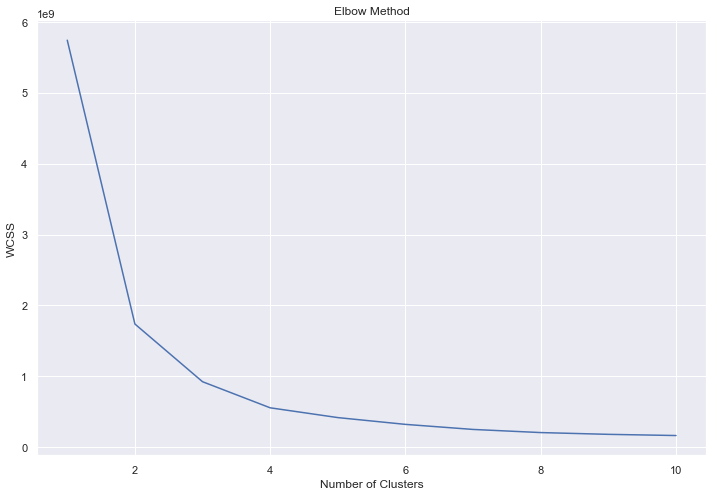

In [35]:
wcss = []

X = data_clean_test[k_cols].values
for i in range(1, 11):
    kmeans = KMeans(n_clusters = i, init = 'k-means++', random_state = 29)
    kmeans.fit(X) 
    wcss.append(kmeans.inertia_)
    

plt.plot(range(1, 11), wcss)
plt.title('Elbow Method')
plt.xlabel('Number of Clusters')
plt.ylabel("WCSS")
plt.show()

In [36]:
kmeans = KMeans(n_clusters = 4, init = 'k-means++', random_state = 29)
y_kmeans = kmeans.fit_predict(X)

for i in range(0,4):
    print('cluster %d has %d rows labled'%(i,np.count_nonzero(y_kmeans == i)))

cluster 0 has 2597 rows labled
cluster 1 has 81 rows labled
cluster 2 has 358 rows labled
cluster 3 has 38 rows labled


In [37]:
data_clean_test['Cluster'] = y_kmeans.tolist()
#data_clean.to_csv('test_kmeans.csv', index = False)

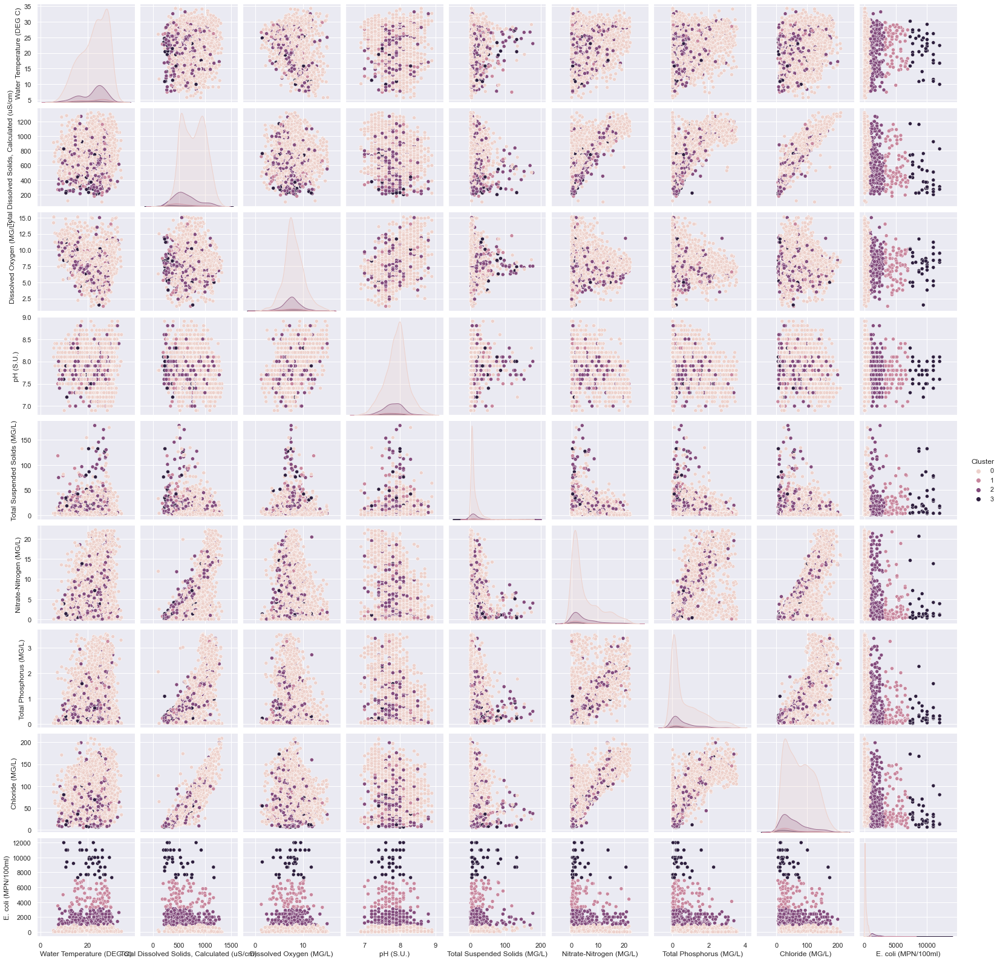

In [38]:
l = k_cols.copy()
l.append('Cluster')

sns.pairplot(data = data_clean_test[l], hue = 'Cluster')

# Elbow method scaled data


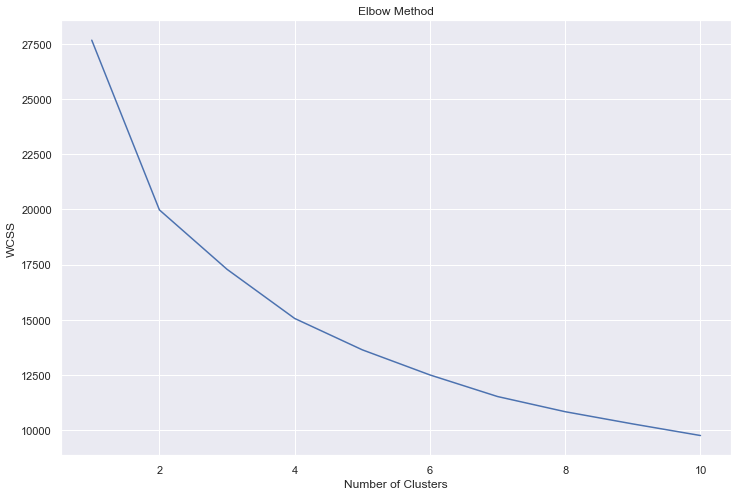

In [39]:
wcss = []

X = data_clean_test[norm_cols].values
for i in range(1, 11):
    kmeans = KMeans(n_clusters = i, init = 'k-means++', random_state = 29)
    kmeans.fit(X) 
    wcss.append(kmeans.inertia_)
    

plt.plot(range(1, 11), wcss)
plt.title('Elbow Method')
plt.xlabel('Number of Clusters')
plt.ylabel("WCSS")
plt.show()


In [40]:
n_clus = 4

kmeans = KMeans(n_clusters = n_clus, init = 'k-means++', random_state = 29)
y_kmeans = kmeans.fit_predict(X)

for i in range(0,n_clus):
    print('cluster %d has %d rows labled'%(i,np.count_nonzero(y_kmeans == i)))

cluster 0 has 898 rows labled
cluster 1 has 115 rows labled
cluster 2 has 1161 rows labled
cluster 3 has 900 rows labled


In [41]:
data_clean_test['Cluster_scaled'] = y_kmeans.tolist()


In [42]:
#data_clean_test.to_csv('test_kmeans.csv', index = False)

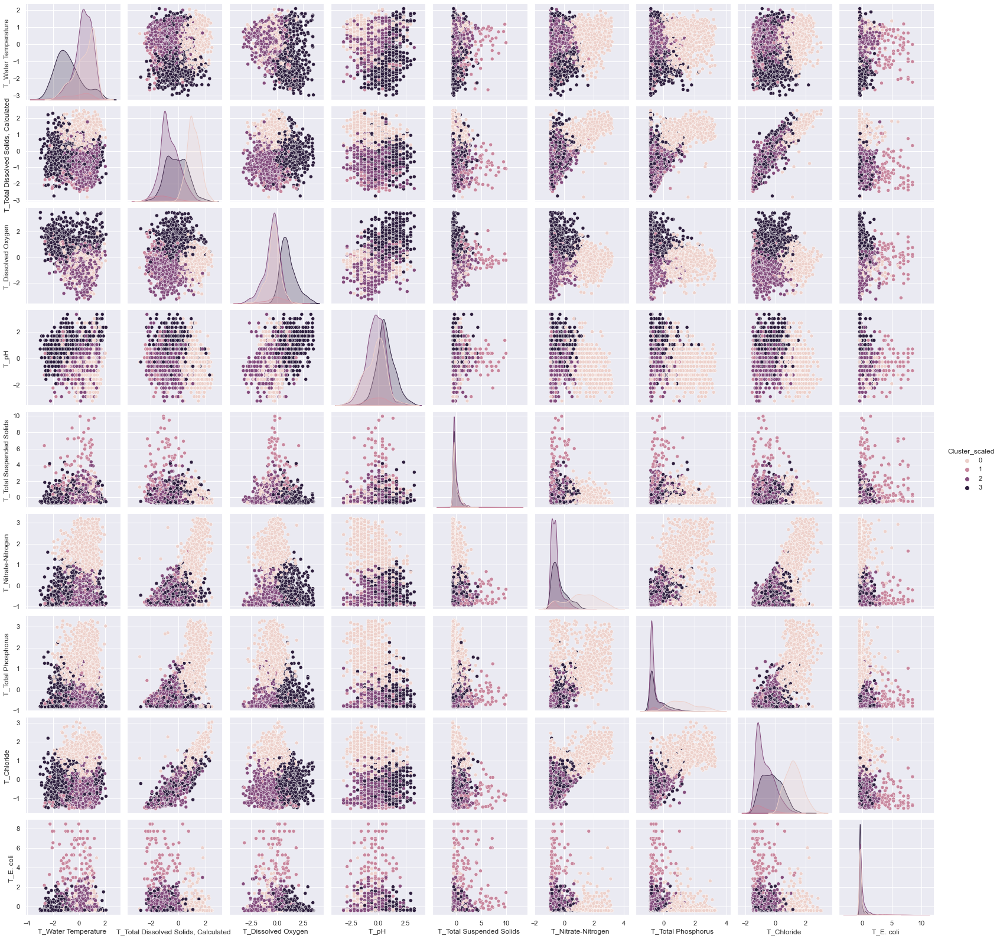

In [43]:
m = norm_cols.copy()
m.append('Cluster_scaled')

sns.pairplot(data = data_clean_test[m], hue = 'Cluster_scaled')

# PCA dimension reduction

In [44]:
from sklearn.decomposition import PCA

pca = PCA(n_components = 3, random_state = 29)

pc = pca.fit_transform(X)

pc_df = pd.DataFrame(data = pc, columns = ['PC1','PC2','PC3'])
pc_df['Cluster'] = y_kmeans.tolist()
pca.explained_variance_ratio_

array([0.37656542, 0.17705687, 0.13049033])

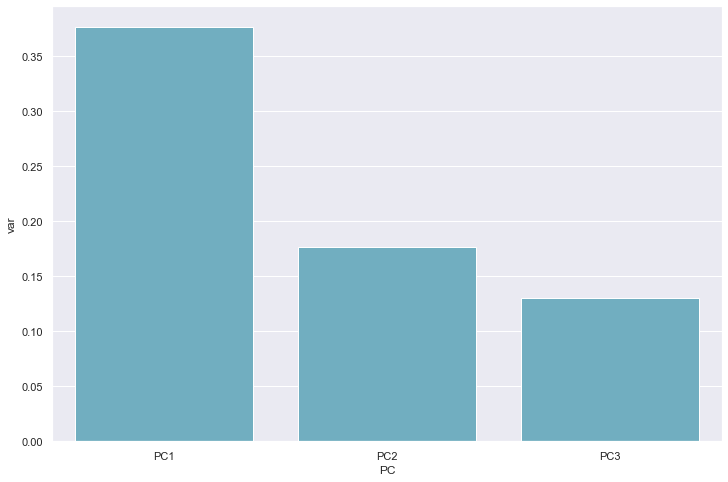

In [45]:
df = pd.DataFrame({'var':pca.explained_variance_ratio_,
             'PC':['PC1','PC2','PC3']})
sns.barplot(x='PC',y="var", 
           data=df, color="c");

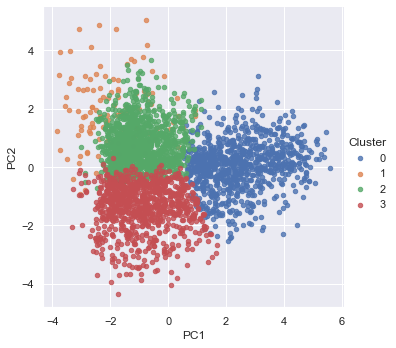

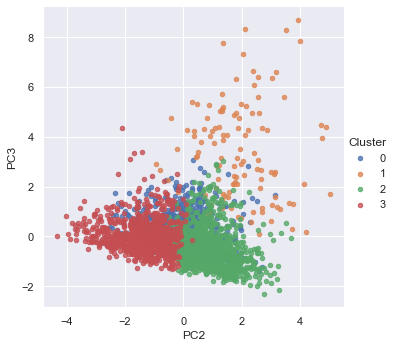

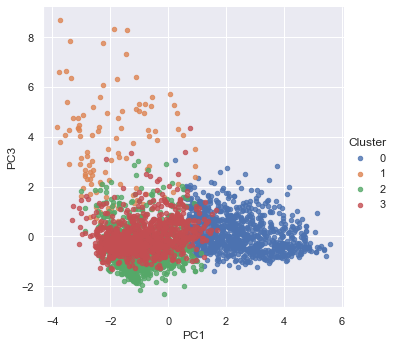

In [46]:
sns.lmplot( x="PC1", y="PC2",
  data=pc_df, 
  fit_reg=False, 
  hue='Cluster', # color by cluster
  legend=True,
  scatter_kws={"s": 20}) # specify the point size

sns.lmplot( x="PC2", y="PC3",
  data=pc_df, 
  fit_reg=False, 
  hue='Cluster', # color by cluster
  legend=True,
  scatter_kws={"s": 20}) # specify the point size

sns.lmplot( x="PC1", y="PC3",
  data=pc_df, 
  fit_reg=False, 
  hue='Cluster', # color by cluster
  legend=True,
  scatter_kws={"s": 20}) # specify the point size

In [47]:
import plotly.express as px

total_var = pca.explained_variance_ratio_.sum() * 100
total_var

fig = px.scatter_3d(
    pc_df, x="PC1", y="PC2", z="PC3", color=pc_df['Cluster'].astype(str),
    title=f'Total Explained Variance: {total_var:.2f}%',
    labels={'0': 'PC 1', '1': 'PC 2', '2': 'PC 3'}
)
fig.show()
fig.update_layout(margin=dict(l=0, r=0, b=0, t=0))

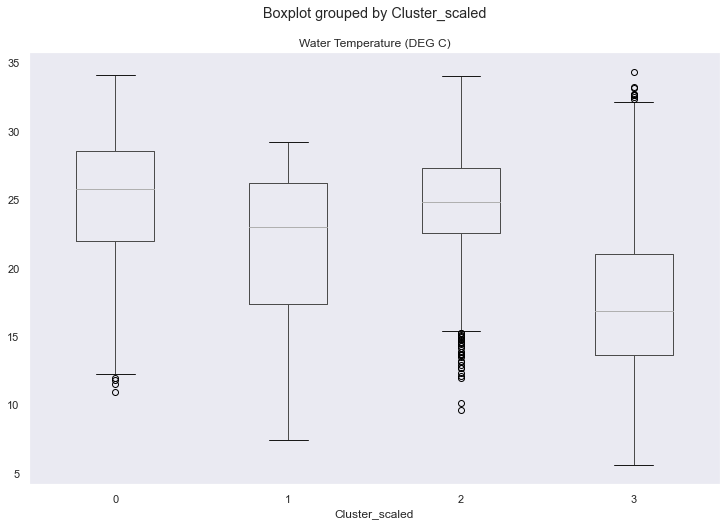

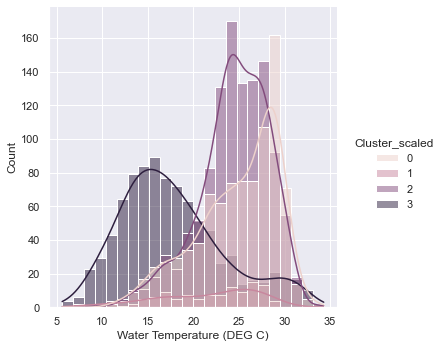

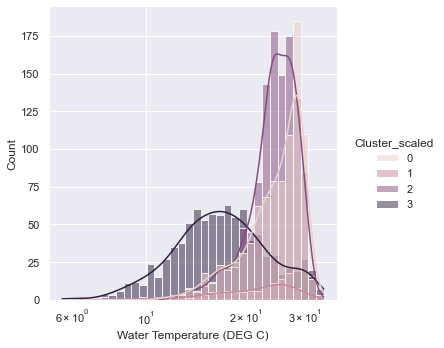

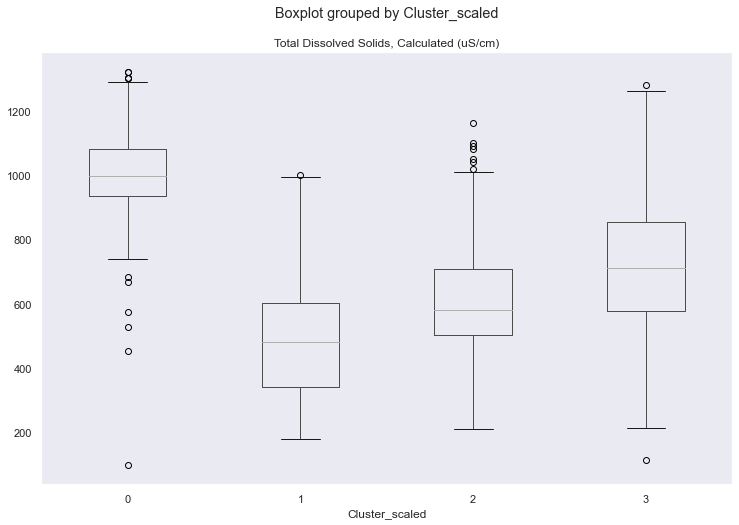

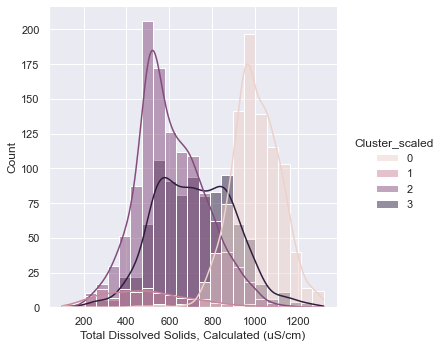

...

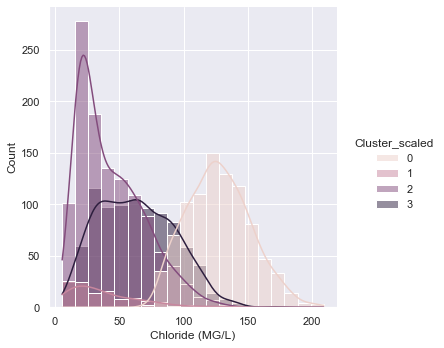

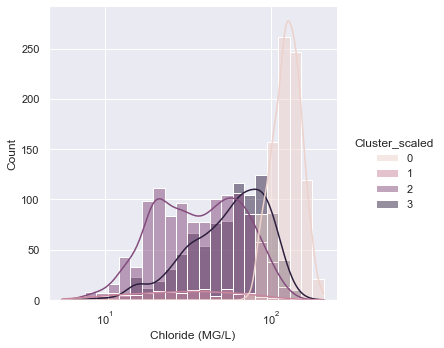

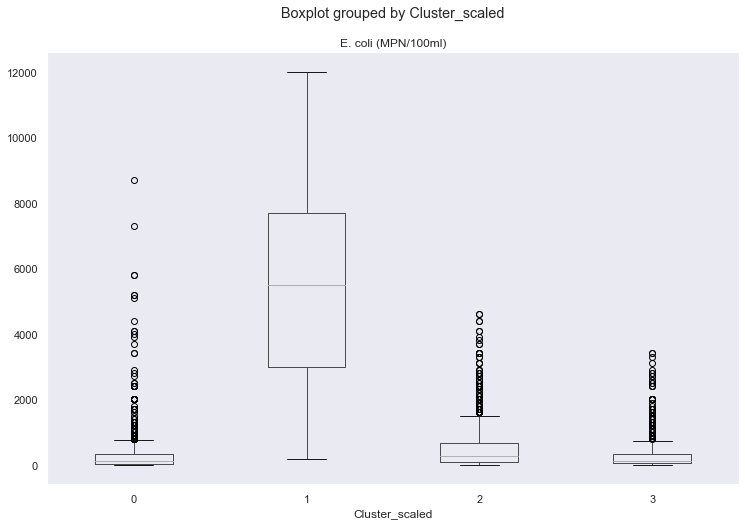

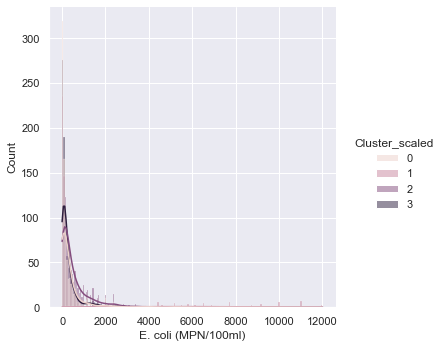

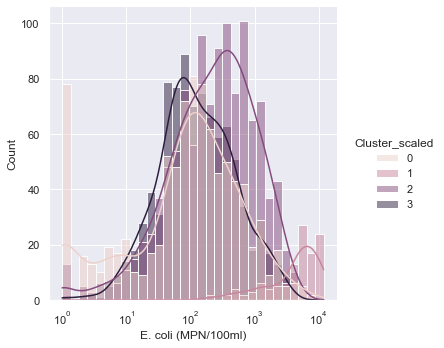

In [48]:
for feature in k_cols:
    data_clean_test.boxplot(column=[feature], by = 'Cluster_scaled')
    plt.grid(False)
    plt.show()
    sns.displot(data = data_clean_test, x=feature, kde=True, hue='Cluster_scaled')
    sns.displot(data = data_clean_test, x=feature, kde=True, hue='Cluster_scaled',log_scale=True)

## Silhoute score

In [49]:
from sklearn.metrics import silhouette_samples, silhouette_score

# Calculate Silhoutte Score
#
score = silhouette_score(X, kmeans.labels_, metric='euclidean')
#
# Print the score
#
print('Silhouette Score: %.3f' % score)


Silhouette Score: 0.229


In [50]:
X = data_clean_test[norm_cols].values
for i in range(2,8):
    n_clus = i

    kmeans = KMeans(n_clusters = i, init = 'k-means++', random_state = 29)
    kmeans.fit_predict(X)
    score = silhouette_score(X, kmeans.labels_, metric='euclidean')
    #
    # Print the score
    #
    print('Silhouette Score for k = %d: %.3f' % (i,score))

Silhouette Score for k = 2: 0.288
Silhouette Score for k = 3: 0.214
Silhouette Score for k = 4: 0.229
Silhouette Score for k = 5: 0.205
Silhouette Score for k = 6: 0.211
Silhouette Score for k = 7: 0.188


# Parallel_Coordinate plots

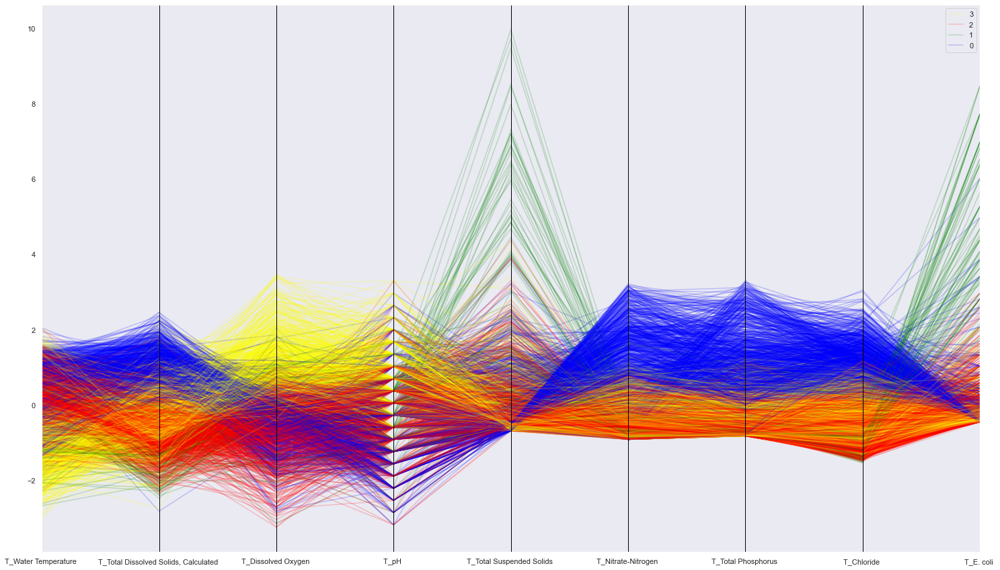

In [51]:
plt.figure(figsize=(25,15))
pd.plotting.parallel_coordinates(data_clean_test, 'Cluster_scaled', norm_cols, sort_labels=True, axvlines=True, alpha=0.2,color=['yellow','blue','red','green'])
plt.show()

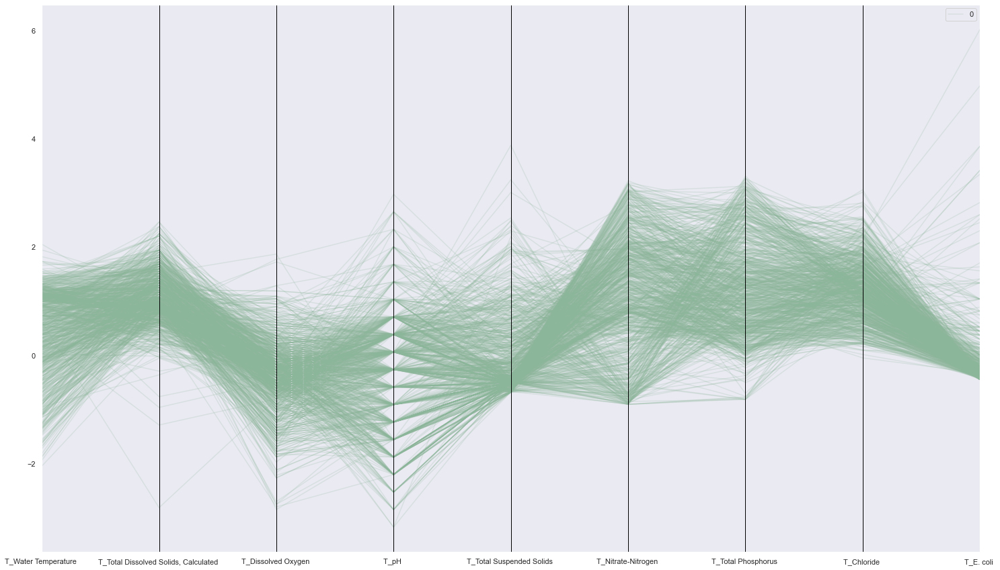

In [52]:
plt.figure(figsize=(25,15))
pd.plotting.parallel_coordinates(data_clean_test.loc[data_clean_test['Cluster_scaled'] == 0], 'Cluster_scaled', norm_cols, sort_labels=True, axvlines=True, alpha=0.2)
plt.show()

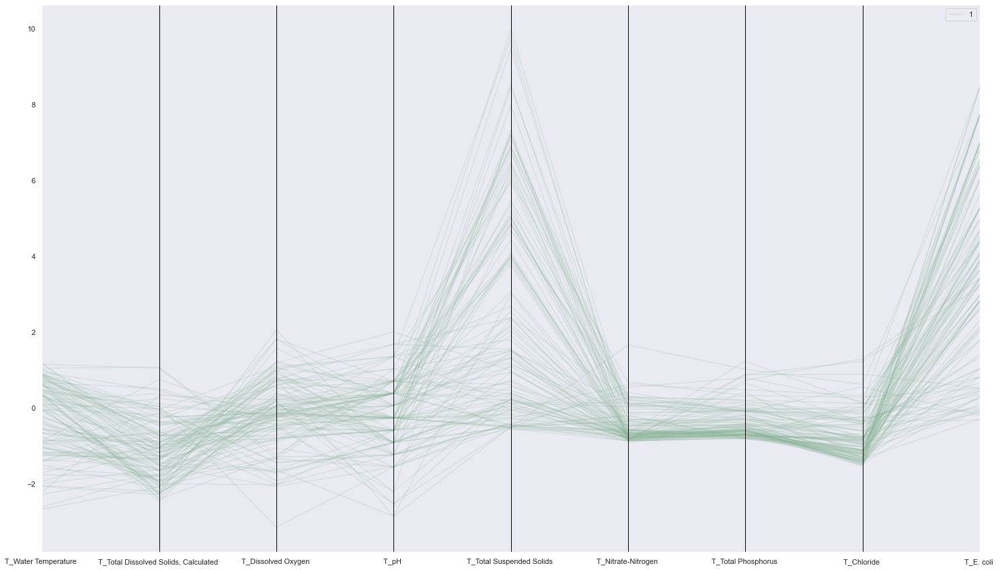

In [53]:
plt.figure(figsize=(25,15))
pd.plotting.parallel_coordinates(data_clean_test.loc[data_clean_test['Cluster_scaled'] == 1], 'Cluster_scaled', norm_cols, sort_labels=True, axvlines=True, alpha=0.2)
plt.show()

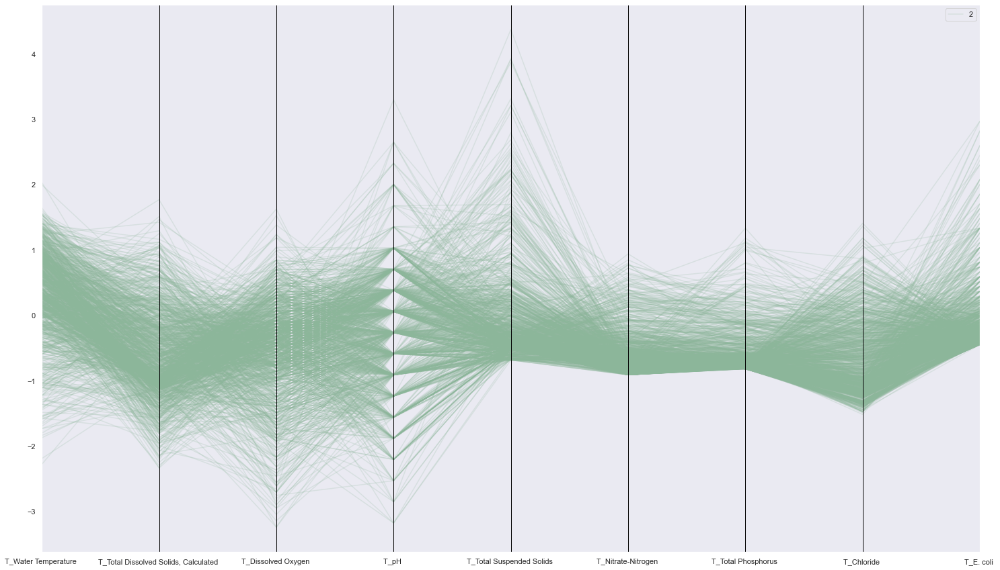

In [54]:
plt.figure(figsize=(25,15))
pd.plotting.parallel_coordinates(data_clean_test.loc[data_clean_test['Cluster_scaled'] == 2], 'Cluster_scaled', norm_cols, sort_labels=True, axvlines=True, alpha=0.2)
plt.show()

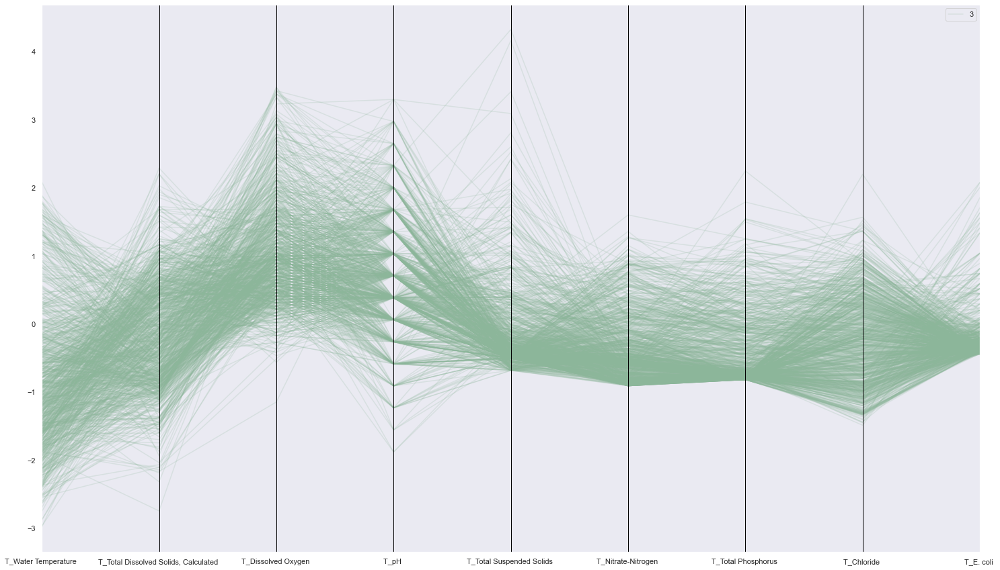

In [55]:
plt.figure(figsize=(25,15))
pd.plotting.parallel_coordinates(data_clean_test.loc[data_clean_test['Cluster_scaled'] == 3], 'Cluster_scaled', norm_cols, sort_labels=True, axvlines=True, alpha=0.2)
plt.show()